In [1]:
#Import statements
from sqlalchemy import create_engine
import cx_Oracle
import pandas as pd
import numpy as np
from IPython.display import display

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

#folium imports
import folium
import branca

In [3]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [4]:
#Connect to oracle DB

host='localhost'
port=1521
sid='springboard'
user='springboard'
password='springboard123'
sid = cx_Oracle.makedsn(host, port, sid=sid)

cstr = 'oracle://{user}:{password}@{sid}'.format(
    user=user,
    password=password,
    sid=sid
)

engine =  create_engine(
    cstr,
    convert_unicode=False,
    pool_recycle=10,
    pool_size=50,
    echo=False
)

In [6]:
#Let's continue with our preliminary analysis of the data
#First let's find out which are the most common procedures

query2 = engine.execute('SELECT HCPCS_CODE, HCPCS_DESCRIPTION, COUNT(*) '
                        'FROM MEDICARECHARGESFINAL '
                        'WHERE HCPCS_CODE NOT LIKE {} '
                        'GROUP BY HCPCS_CODE, HCPCS_DESCRIPTION '
                        'HAVING COUNT(*) >= 10000 '
                        'ORDER BY COUNT(*) DESC '.format(("'99%'")))

df2 = pd.DataFrame(query2.fetchall())
df2.columns = query2.keys()
print(df2.head())

  hcpcs_code                                  hcpcs_description  COUNT(*)
0      G0008          Administration of influenza virus vaccine    140912
1      36415  Insertion of needle into vein for collection o...     93570
2      G0009             Administration of pneumococcal vaccine     89307
3      90662    Vaccine for influenza for injection into muscle     85351
4      93000  Routine EKG using at least 12 leads including ...     83106


In [7]:
#cpt_list - to be used in correlation calculation
#cpt_list_str - CPT codes to be used in query
# refinedList - formats cpt_list_str to be used inside SQL query

cpt_list = df2['hcpcs_code'].tolist()

df2['hcpcs_str'] = '\'' + df2['hcpcs_code'] + '\''
df2.hcpcs_str.head()

cpt_list_str = df2['hcpcs_str'].tolist()

refinedList = ','.join(a for a in cpt_list_str)

In [8]:
query3 = engine.execute('SELECT NPI,HCPCS_CODE, HCPCS_DESCRIPTION, ST_ABBR, FIPS_ST, FIPS_CO, '
                            'AVERAGE_SUBMITTED_CHRG_AMT AS AVG_CHARGES '
                            'FROM MEDICARECHARGESFINAL '
                            'WHERE HCPCS_CODE IN ({}) '.format(refinedList))
df3 = pd.DataFrame(query3.fetchall())
df3.columns = query3.keys()
print(df3.head()) 

          npi hcpcs_code                                  hcpcs_description  \
0  1003000134      88304  Pathology examination of tissue using a micros...   
1  1003000134      88305  Pathology examination of tissue using a micros...   
2  1003000134      88341  Special stained specimen slides to examine tissue   
3  1003000134      88342   Tissue or cell analysis by immunologic technique   
4  1003000407      36556  Insertion of central venous catheter for infus...   

  st_abbr fips_st fips_co avg_charges  
0      IL      17     031         115  
1      IL      17     031         170  
2      IL      17     031          68  
3      IL      17     031         147  
4      PA      42     021         621  


In [19]:
#df3.to_csv('data/MedicareChargesDataCorr.csv',index = None)

In [9]:
#Close DB connection
conn = engine.connect()
conn.close()

In [10]:
#Add FIPS column & convert avg_charges to floats
df3['FIPS'] = df3['fips_st'] + df3['fips_co']
df3['avg_charges'] = pd.to_numeric(df3.avg_charges, downcast='float')
df3.head()

,npi,hcpcs_code,hcpcs_description,st_abbr,fips_st,fips_co,avg_charges,FIPS
0,1003000134,88304,Pathology examination of tissue using a micros...,IL,17,031,115.0,17031
1,1003000134,88305,Pathology examination of tissue using a micros...,IL,17,031,170.0,17031
2,1003000134,88341,Special stained specimen slides to examine tissue,IL,17,031,68.0,17031
3,1003000134,88342,Tissue or cell analysis by immunologic technique,IL,17,031,147.0,17031
4,1003000407,36556,Insertion of central venous catheter for infus...,PA,42,021,621.0,42021


In [11]:
#function to get dataframe with average charges and FIPS data
def get_avg_charges_FIPS(data,cpt):
    data_sel = data[data.hcpcs_code==cpt]
    data_avg_FIPS =data_sel[['FIPS','avg_charges']]
    return data_avg_FIPS

#Test data for function
data_test = get_avg_charges_FIPS(df3,'G0444')
data_test.head()

,FIPS,avg_charges
1220,13073,50.0
2018,48113,50.0
2058,54011,32.0
3423,48113,25.0
3801,39095,53.0


In [12]:
#Generate stats matrix
def generate_stats(data,cpt_list):
    stats_df = pd.DataFrame(columns=['count','mean','std','min','10%','20%','25%','50%','75%','80%','90%','max',])
    for cpt in cpt_list:
        avg_charges_data = get_avg_charges_FIPS(data,cpt)
        perc10 = avg_charges_data.avg_charges.quantile(.1)
        perc20 = avg_charges_data.avg_charges.quantile(.2)
        perc80 = avg_charges_data.avg_charges.quantile(.8)
        perc90 = avg_charges_data.avg_charges.quantile(.9)
        stats = pd.DataFrame(avg_charges_data.describe())
        stats_tr = stats.transpose()
        stats_tr.reset_index(drop=True, inplace=True)
        stats_df.loc[cpt] = [stats_tr['count'][0],stats_tr['mean'][0],stats_tr['std'][0],stats_tr['min'][0], \
                            perc10, perc20, stats_tr['25%'][0], stats_tr['50%'][0],stats_tr['75%'][0], \
                            perc80, perc90, stats_tr['max'][0]]        
    return stats_df   

test_stats = generate_stats(df3,cpt_list)

In [13]:
#Print sample data
display(test_stats.head())

,count,mean,std,min,10%,20%,25%,50%,75%,80%,90%,max
G0008,140912.0,33.228168,19.967112,0.010000,19.4,22.150320,23.000000,30.000000,40.000000,43.461697,53.333332,2172.384766
36415,93570.0,14.862174,9.786969,0.010000,5.5,8.000000,9.000000,14.000000,20.000000,20.000000,25.000000,874.090027
G0009,89307.0,35.801098,24.382719,0.010000,18.0,20.399092,23.043973,31.285715,44.629398,46.348903,57.094544,2057.633789
90662,85351.0,50.535107,18.505285,0.010000,40.0,40.590000,40.917183,42.328163,54.585850,60.000000,75.000000,500.000000
93000,83106.0,64.042839,33.132668,11.545403,33.0,40.000000,44.000000,59.000000,75.000000,80.000000,99.042194,525.859192


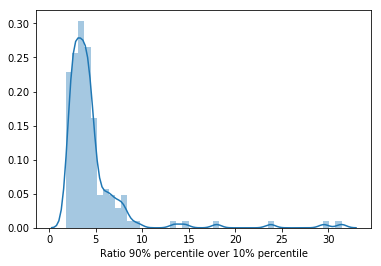

In [15]:
#Graphing the ratio of 90% percentile values over 10% percentile values
test_stats['90_over_10']= test_stats['90%']/test_stats['10%']

z = pd.Series(list(test_stats['90_over_10']), name="Ratio 90% percentile over 10% percentile")

az = sns.distplot(z)

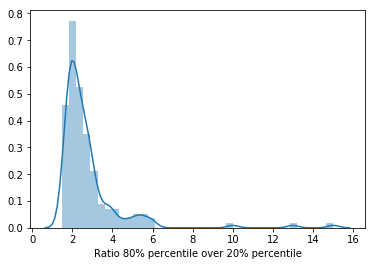

In [16]:
#Graphing the ratio of 80% percentile values over 20% percentile values
test_stats['80_over_20']= test_stats['80%']/test_stats['20%']

z = pd.Series(list(test_stats['80_over_20']), name="Ratio 80% percentile over 20% percentile")

az = sns.distplot(z)

In [19]:
#Get percentile avg charge values for a specific CPT code - percentile values (10%,20%,25%,50%,75%,80%,90%)
def get_percentile_cpt(cpt,percentile):
    avg_charge_perc = test_stats.loc[cpt,percentile]
    return avg_charge_perc


In [20]:
#Get data for specific CPT code
def get_data_cpt(cpt):
    data_cpt = df3[df3.hcpcs_code==cpt]
    return data_cpt



In [21]:
#Get Number of NPI's per county for each specific procedure
def get_npi_total(data):
    data_npi = data[['npi','FIPS','avg_charges']]
    data_npi_grouped = data_npi.groupby('FIPS',as_index=False).size().to_frame('count_npi').reset_index()
    return data_npi_grouped


In [22]:
#Get charges data grouped by FIPS code
def get_charges_FIPS(data,low,high):
    data_county =data[(data.avg_charges>=low)&(data.avg_charges<=high)][['npi','FIPS','avg_charges']]
    data_grouped =data_county.groupby('FIPS',as_index=False).size().to_frame('count_over').reset_index()
    return data_grouped


In [23]:
#Merge both datasets with partial count and total number of NPIS per county & add ratio
def get_merged_data(data_FIPS,data_npi):
    final_data = pd.merge(data_FIPS[['FIPS','count_over']], data_npi[['FIPS','count_npi']], on='FIPS')
    final_data.reset_index()
    final_data['npi_ratio'] = (final_data['count_over']/final_data['count_npi'])*100
    final_data['npi_ratio'] = pd.to_numeric(final_data.npi_ratio, downcast='float')
    return final_data

In [24]:
#Function to calculate npi_ratio for a CPT - input parameter - CPT code, low end percentile, high-end percentile
def get_npi_ratio(cpt,low,high):
    #Get avg charges for percentiles
    charges_low = get_percentile_cpt(cpt,low)
    charges_high = get_percentile_cpt(cpt,high)
    #Get data for specific CPT
    data_sel = get_data_cpt(cpt)
    #Count providers per county
    data_npi_grouped = get_npi_total(data_sel)
    #Data for charges
    data_FIPS_grouped = get_charges_FIPS(data_sel,charges_low,charges_high)
    final_data = get_merged_data(data_FIPS_grouped,data_npi_grouped)
    return final_data

In [25]:
#Get npi ratios for all procedures
def get_FIPS_npi_ratios(cpt_list,low,high):
    FIPS_npi_matrix = pd.DataFrame()
    for cpt in cpt_list:
        npi_ratio = get_npi_ratio(cpt,low,high)
        FIPS_npi_matrix[cpt] =pd.Series(npi_ratio['npi_ratio'].values, index=npi_ratio.FIPS)
    FIPS_npi_matrix['mean'] = FIPS_npi_matrix.mean(axis=1)
    FIPS_npi_matrix['mean'] = pd.to_numeric(FIPS_npi_matrix['mean'], downcast='float')
    return FIPS_npi_matrix

#All procedures
test_matrix = get_FIPS_npi_ratios(cpt_list,'75%','90%')

print(test_matrix.head())

           G0008      36415  G0009  90662      93000  90670  G0439     96372  \
FIPS                                                                           
01001   4.761905  30.000000    NaN    NaN        NaN    NaN    NaN  5.263158   
01013  13.333333  11.111111    NaN   10.0  22.222221    NaN  100.0       NaN   
01017  27.272728        NaN    NaN    NaN        NaN    NaN    NaN       NaN   
01019  10.000000        NaN    NaN    NaN  80.000000    NaN    NaN       NaN   
01039   4.166667        NaN   20.0    NaN        NaN    NaN   20.0  8.695652   

           71020  93010    ...      82306  27447  88341  73080      J1885  \
FIPS                       ...                                              
01001  18.181818   25.0    ...        NaN    NaN    NaN    NaN        NaN   
01013  40.000000    NaN    ...        NaN    NaN    NaN    NaN  36.363636   
01017        NaN   50.0    ...        NaN    NaN    NaN    NaN        NaN   
01019        NaN    NaN    ...        NaN    NaN    Na

In [26]:
#Import demographics data into dataframe

demo_data = pd.read_csv('data/DemographicData2016.csv', dtype ='str')
demo_data['Median_income'] = pd.to_numeric(demo_data.Median_income, downcast='float')
demo_data['Population'] = pd.to_numeric(demo_data.Population)
demo_data['Perc_over_65'] = pd.to_numeric(demo_data.Perc_over_65, downcast='float')
demo_data.head()

,FIPS,State,County,Median_income,Population,Perc_over_65
0,01001,Alabama,Autauga,54487.0,55416,14.700000
1,01003,Alabama,Baldwin,56460.0,208563,19.700001
2,01005,Alabama,Barbour,32884.0,25965,18.000000
3,01007,Alabama,Bibb,43079.0,22643,15.400000
4,01009,Alabama,Blount,47213.0,57704,18.000000


In [27]:
#Merge demographics data with test mastrix

merged_data = pd.merge(test_matrix, demo_data, on='FIPS')
merged_data.set_index('FIPS', inplace=True)
merged_data["Rank"] = merged_data["mean"].rank(ascending=False) 
merged_data.sort_values("Rank", inplace = True)
merged_data.head()

,G0008,36415,G0009,90662,93000,90670,G0439,96372,71020,93010,...,82043,87880,G0444,mean,State,County,Median_income,Population,Perc_over_65,Rank
FIPS,,,,,,,,,,,,,,,,,,,,,
30095,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,100.0,Montana,Stillwater,59905.0,9406,21.4,9.0
21219,100.0,NaN,100.0,100.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,100.0,100.0,Kentucky,Todd,41072.0,12295,15.9,9.0
31071,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,100.0,Nebraska,Garfield,44016.0,2011,28.5,9.0
02195,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,100.0,Alaska,Petersburg,60540.0,3149,14.0,9.0
19089,100.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,100.0,Iowa,Howard,49916.0,9332,20.4,9.0


In [28]:
#Calculate correlation between mean % and median income
correl_med_income = merged_data['mean'].corr(merged_data['Median_income'])
#print(correl_med_income)
#Calculate correlation between avg charges and county population
correl_popul = merged_data['mean'].corr(merged_data['Population'])
#print(correl_popul)
#Calculate correlation between avg charges and # population over 65
correl_over65 = merged_data['mean'].corr(merged_data['Perc_over_65'])
#print(correl_over65)

display(correl_med_income, correl_popul, correl_over65)

-0.2753118916603105

-0.38344955968948563

0.26358932409257485

In [29]:
#Generate correlation distributions
def generate_corr_dict(data, cpt_list):
    med_income_dict = {}
    popul_dict = {}
    over65_dict = {}
    for cpt in cpt_list:
        correl_med_income = data[cpt].corr(data['Median_income'])
        correl_popul = data[cpt].corr(data['Population'])
        correl_over65 = data[cpt].corr(data['Perc_over_65'])
        med_income_dict[cpt]=correl_med_income
        popul_dict[cpt] = correl_popul
        over65_dict[cpt] = correl_over65
    return (med_income_dict, popul_dict, over65_dict)    

test_dict1, test_dict2, test_dict3 = generate_corr_dict(merged_data, cpt_list)

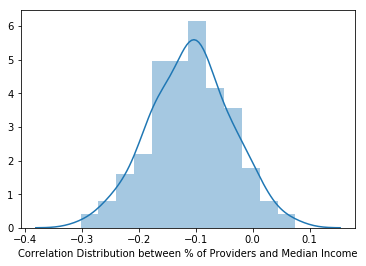

In [30]:
#test_dict.values()

x = pd.Series(list(test_dict1.values()), name="Correlation Distribution between % of Providers and Median Income")

#print(x)
ax = sns.distplot(x)

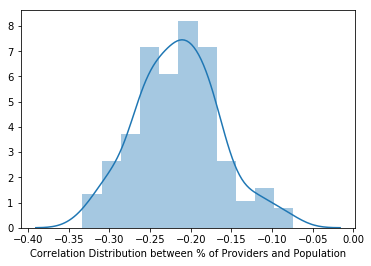

In [31]:
#test_dict.values()

x = pd.Series(list(test_dict2.values()), name="Correlation Distribution between % of Providers and Population")

#print(x)
ax = sns.distplot(x)

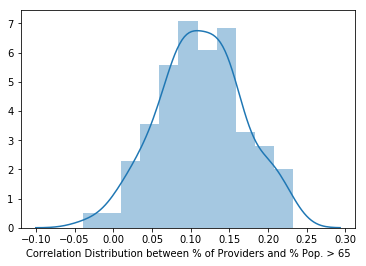

In [32]:
#test_dict.values()

x = pd.Series(list(test_dict3.values()), name="Correlation Distribution between % of Providers and % Pop. > 65")

#print(x)
ax = sns.distplot(x)

In [34]:
#Create folium map
test_matrix['FIPS_Map'] = '0500000US' + test_matrix.index
    
map_1 = folium.Map(location=[39, -96], zoom_start=4)
high_res_county_geo = "data/gz_2010_us_050_00_5m.json" 
map_1.choropleth(
 geo_data=high_res_county_geo,
 name='choropleth',
 data=test_matrix,
 columns=['FIPS_Map', 'mean'],
 key_on='properties.GEO_ID',
 fill_color='YlGnBu',
 fill_opacity=0.8,
 line_opacity=0.05,
 legend_name='Average percentage of providers per county who charge over 80% percentile for 160 procedures',    
 bins=[0,25.0,50.0,75.0,100.0]
 #bins=[0,20.0,40.0,60.0,80.0,100.0]
 #bins=6
 )
folium.LayerControl().add_to(map_1)
map_1  

#print(test_matrix.sort_values(by=['mean'], ascending=False))


In [35]:
#Create folium map - Top 500 counties with highest mean percentage of high charges
merged_data['FIPS_Map'] = '0500000US' + merged_data.index
    
map_1 = folium.Map(location=[39, -96], zoom_start=4)
high_res_county_geo = "data/gz_2010_us_050_00_5m.json" 
map_1.choropleth(
 geo_data=high_res_county_geo,
 name='choropleth',
 data=merged_data.head(500),
 columns=['FIPS_Map', 'mean'],
 key_on='properties.GEO_ID',
 fill_color='YlGnBu',
 fill_opacity=0.8,
 line_opacity=0.05,
 legend_name='Average percentage of providers per county who charge over 80% percentile for 160 procedures',    
 bins=[0,25.0,50.0,75.0,100.0]
 #bins=[0,20.0,40.0,60.0,80.0,100.0]
 #bins=6
 )
folium.LayerControl().add_to(map_1)
map_1 